##### import libraries

In [1]:
import json 
import cv2
from matplotlib import pyplot as plt
import numpy, numpy as np
from preprocess import *
import SimpleITK as sitk
from collections import OrderedDict
import os
from os.path import exists, join
from register_images import *
import sys
sys.path.insert(0, '../')
from parse_registration_json import ParserRegistrationJson
from parse_study_dict import ParserStudyDict
import time
import pydicom
from pathlib import Path

from miit.spatial_data.base_types import Image as MImage
from miit.spatial_data.base_types import Annotation as MAnnotation
from miit.utils.distance_unit import DUnit

In [2]:
def load_mri(directory):
    file_id_list = []
    for file_ in os.listdir(directory):
        path = join(directory, file_)
        dc = pydicom.dcmread(path)
        instance_number = int(dc[0x0020, 0x0013].value)
        file_id_list.append((instance_number, file_))
    file_id_list_sorted = sorted(file_id_list, key=lambda x: x[0])
    img_series_reader = sitk.ImageSeriesReader()
    img_series_reader.SetFileNames([join(directory, x[1]) for x in file_id_list_sorted])
    # img_series_reader.
    t2w_img_sitk = img_series_reader.Execute()
    return t2w_img_sitk      


def get_padding_params(img: numpy.array, shape: int) -> tuple[int, int, int, int]:
    pad_x = shape - img.shape[0]
    pad_x_l = pad_x // 2
    pad_x_u = pad_x // 2
    if pad_x % 2 != 0:
        pad_x_u += 1
    pad_y = shape - img.shape[1]
    pad_y_l = pad_y // 2
    pad_y_u = pad_y // 2
    if pad_y % 2 != 0:
        pad_y_u += 1
    return pad_y_l, pad_y_u, pad_x_l, pad_x_u


def scale_image(img, factors: tuple[float, float], interpolation: int = 1):
    w, h = img.shape[:2]
    nw = int(w * factors[0])
    nh = int(h * factors[1])
    return cv2.resize(img, (nh, nw), interpolation=interpolation)
    
        

def preprocess_hist_miit(img: numpy.ndarray, 
                         mask: numpy.ndarray,
                         padding: int = 30) -> tuple[numpy.ndarray, numpy.ndarray, dict]:
    """Does the following preprocessing steps:
        1. Applies mask.
        2. Crops around the masked area.
        3. Adds padding.
    """

    # Downsize by 4. Or resize to 500px
    if len(mask.shape) == 2:
        mask_ = np.expand_dims(mask, -1)
    else:
        mask_ = mask
    img = img * mask_
    # This doesnt make sense, since the cropping happens immediately afterwards.
    # Maybe a refactoring mistake?
    # img = np.pad(img,((img.shape[0],img.shape[0]),(img.shape[1],img.shape[1]),(0,0)),'constant', constant_values=0)
    # mask = np.pad(mask,((mask.shape[0], mask.shape[0]), (mask.shape[1], mask.shape[1]),(0,0)),'constant', constant_values=0)

    # create a bounding box around slice
    preprocessing_steps = {}
    points = np.argwhere(mask != 0)
    points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
    y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
    img = img[x:x+w, y:y+h]
    mask = mask[x:x+w, y:y+h]
    preprocessing_steps['crop'] = {}
    preprocessing_steps['crop']['y'] = y
    preprocessing_steps['crop']['x'] = x
    preprocessing_steps['crop']['h'] = h
    preprocessing_steps['crop']['w'] = w
    # Pad to a square shape now.
    max_size = max(img.shape[0], img.shape[1])
    ylo, yhi, xlo, xhi = get_padding_params(img, max_size)
    ylo += padding
    yhi += padding
    xlo += padding
    xhi += padding
    preprocessing_steps['sym_pad'] = {}
    preprocessing_steps['sym_pad']['ylo'] = ylo
    preprocessing_steps['sym_pad']['yhi'] = yhi
    preprocessing_steps['sym_pad']['xlo'] = xlo
    preprocessing_steps['sym_pad']['yhi'] = yhi
    img = np.pad(img,((xlo, xhi),(ylo, yhi),(0,0)),'constant', constant_values=0)
    mask = np.pad(mask,((xlo, xhi), (ylo, yhi)),'constant', constant_values=0)
    return img, mask, preprocessing_steps


def preprocess_mri(mri: numpy.ndarray,
                    mri_masks: numpy.ndarray,
                    padding: int = 30):
    if len(mri.shape) == 0:
        mri = np.expand_dims(mri, 0)
    prepr_mri = []

    # Make a first pass to get the maximum size
    max_size = 0
    for i in range(mri_masks.shape[0]):
        mask = mri_masks[i]
        points = np.argwhere(mask != 0)
        points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
        y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
        max_size_ = max(w, h)
        if max_size_ > max_size:
            max_size = max_size_

    max_size = max_size + 2 * padding
    for i in range(mri.shape[0]):
        prepr_steps = {}
        mri_slice = mri[i]
        mri_mask = mri_masks[i]

        if np.sum(mri_mask) == 0:
            continue

        mri_slice = mri_slice * mri_mask
        mri_mask = mri_mask * 255
        points = np.argwhere(mri_mask != 0)
        points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
        y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
        prepr_steps['crop'] = {}
        prepr_steps['crop']['y'] = y
        prepr_steps['crop']['x'] = x
        prepr_steps['crop']['h'] = h
        prepr_steps['crop']['w'] = w
        prepr_steps['slice'] = i

        mri_slice = mri_slice[x:x+w, y:y+h]
        mri_slice = mri_slice / max(int(np.max(mri_slice) / 255), 1)
        mri_slice = mri_slice * 25.5/(np.max(mri_slice)/10)

        ylo, yhi, xlo, xhi = get_padding_params(mri_slice, max_size)
        prepr_steps['sym_pad'] = {}
        prepr_steps['sym_pad']['ylo'] = ylo
        prepr_steps['sym_pad']['yhi'] = yhi
        prepr_steps['sym_pad']['xlo'] = xlo
        prepr_steps['sym_pad']['xhi'] = xhi

        mri_slice = np.pad(mri_slice,((xlo, xhi),(ylo, yhi)),'constant', constant_values=0)
        mri_mask = np.pad(mri_mask,((xlo, xhi), (ylo, yhi)),'constant', constant_values=0)
             
        prepr_mri.append((mri_slice, mri_mask, prepr_steps))
    return prepr_mri


from dataclasses import dataclass, field

from miit.registerers.base_registerer import Registerer, RegistrationResult
from numpy import ndarray


@dataclass(kw_only=True)
class ProsRegNetExt:

    use_cuda: bool
    affine_model: nn.Module | None = None
    tps_model: nn.Module | None = None
    

    @classmethod
    def init_registerer(cls, 
                        path_to_affine_model: str | None = None,
                        path_to_tps_model: str | None = None,
                        use_cuda: bool | None = None,
                        feature_extraction_cnn: str = 'resnet101'):
        if use_cuda is None:
            use_cuda = torch.cuda.is_available()
        if path_to_affine_model:
            affine_model = ProsRegNet(use_cuda=use_cuda, geometric_model='affine', feature_extraction_cnn=feature_extraction_cnn)
        if path_to_tps_model:
            tps_model = ProsRegNet(use_cuda=use_cuda, geometric_model='tps', feature_extraction_cnn=feature_extraction_cnn) 
        return cls(affine_model=affine_model,
                   tps_model=tps_model,
                   use_cuda=use_cuda)   
    
    def register(self, 
                 hist_img: numpy.ndarray, 
                 mri: numpy.ndarray,
                 hist_mask: numpy.ndarray | None = None,
                 mri_mask: numpy.ndarray | None = None,
                 hist_resolution: DUnit | tuple[DUnit, DUnit] | None = None,
                 mri_resolution: DUnit | tuple[DUnit, DUnit] | None = None,
                 reg_resolution: DUnit | tuple[DUnit, DUnit] | None = None,
                 do_affine: bool = True,
                 do_tps: bool = True,
                 use_masks_as_affine: bool = True,
                 use_cuda: bool | None = None,
                 **kwargs: dict) -> RegistrationResult:
        if hist_resolution is None:
            hist_resolution = DUnit.default_dunit()
        if isinstance(hist_resolution, DUnit):
            hist_resolution = (hist_resolution, hist_resolution)
        
        if mri_resolution is None:
            mri_resolution = DUnit.default_dunit()
        if isinstance(mri_resolution, DUnit):
            mri_resolution = (mri_resolution, mri_resolution)
        
        if reg_resolution is None:
            reg_resolution = DUnit('75', 'um')
        if isinstance(reg_resolution, DUnit):
            reg_resolution = (reg_resolution, reg_resolution)

        hist_conversion_factor_w = reg_resolution[0].get_conversion_factor(hist_resolution[0])     
        hist_conversion_factor_h = reg_resolution[1].get_conversion_factor(hist_resolution[1])     
        
        mri_conversion_factor_w = reg_resolution[0].get_conversion_factor(mri_resolution[0])
        mri_conversion_factor_h = reg_resolution[1].get_conversion_factor(mri_resolution[1])
        
        hist_img = scale_image(hist_img, (hist_conversion_factor_w, hist_conversion_factor_h), interpolation=cv2.INTER_CUBIC)
        hist_mask = scale_image(hist_mask, (hist_conversion_factor_w, hist_conversion_factor_h), interpolation=cv2.INTER_NEAREST)
        
        mri_swapped = np.moveaxis(mri, 0, 2)
        mri_mask_swapped = np.moveaxis(mri_mask, 0, 2)
        
        mri_swapped = scale_image(mri_swapped, (mri_conversion_factor_w, mri_conversion_factor_h), interpolation=cv2.INTER_CUBIC)                
        mri_mask_swapped = scale_image(mri_mask_swapped, (mri_conversion_factor_w, mri_conversion_factor_h), interpolation=cv2.INTER_NEAREST)
        
        mri_swapped = np.moveaxis(mri_swapped, 2, 0)
        mri_mask_swapped = np.moveaxis(mri_mask_swapped, 2, 0)
        
        hist_img, hist_mask, hist_prepr = preprocess_hist_miit(hist_img, hist_mask)
        
        mri_prep = preprocess_mri(mri_swapped, mri_mask_swapped)

        mri_slices = []
        mri_masks = []
        mri_prep_steps = []
        for (mri_slice, mri_mask, prep_step) in mri_prep:
            mri_slices.append(mri_slice)
            mri_masks.append(mri_mask)
            mri_prep_steps.append(prep_step)
        
        reg_result = self.register_(
            mri_slices,
            hist_img,
            mri_masks,
            do_affine,
            do_tps,
            use_masks_as_affine,
            use_cuda 
        )

        return reg_result


        
    def register_(self, 
                  mri_slices: list[numpy.ndarray], 
                  hist_image: numpy.ndarray,                   
                  mri_masks: list[numpy.ndarray] | None = None,
                  hist_mask: numpy.ndarray | None = None,
                  do_affine: bool = True,
                  do_tps: bool = True,
                  use_masks_as_affine: bool = True,
                  use_cuda: bool | None = None): 
        ####### grab files that were preprocessed     
        if use_cuda is None:
            use_cuda = self.use_cuda

        reg_data = []
        count = len(mri_slices)
        model_cache = (self.affine_model, self.tps_model, do_affine, do_tps, use_cuda)
        print(f'Maximum count: {count}')
        for idx in range(count): 
            print(idx)
            mri_slice = mri_slices[idx]
            mri_mask = None if mri_masks is None else mri_masks[idx]
            w_new, h_new = mri_slice.shape[:2]
            affTps, theta = runCnn2(model_cache=model_cache, 
                                    source_image=hist_image, 
                                    target_image=mri_slice, 
                                    source_mask=hist_mask,
                                    target_mask=mri_mask,
                                    use_mask_for_affine=use_masks_as_affine)         
            affTps = cv2.resize(affTps*255, (int(h_new),  int(w_new)), interpolation=cv2.INTER_CUBIC)   
            
            reg_data.append((theta, affTps, hist_image, mri_slice))
        
        return reg_data


In [3]:
mri_path = '/mnt/archive/prostomics/raw_data/mri/DLN_cohort/dataset/DLR_0088/DLR_0088_ST_140613/t2_tse_tra_320_3mm_6/'
seg_path  = '/mnt/archive/prostomics/raw_data/mri/DLN_cohort/segmentation/automated/DLR_0088_ST_140613.nii.gz'
hist_path = '/mnt/scratch/maximilw/data/multiomics/hist_mri_matching/data/miit_objects3/B17337_13.4/cee3da1e-711f-11ef-85ab-fa163eee643f/image.ome.tif'
hist_mask_path = '/mnt/scratch/maximilw/data/multiomics/hist_mri_matching/data/miit_objects3/B17337_13.4/ee6073fc-711f-11ef-85ab-fa163eee643f/annotations.nii.gz'


In [4]:
mri_cube = load_mri(mri_path)
mri_resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
mri_masks = sitk.GetArrayFromImage(sitk.ReadImage(seg_path))
mri_cube = sitk.GetArrayFromImage(mri_cube)
hist_img = sitk.GetArrayFromImage(sitk.ReadImage(hist_path))
hist_img = hist_img[:,:,:3]
hist_img = MImage(data=hist_img)
hist_img.set_resolution(DUnit(4, 'um'))
hist_mask = sitk.GetArrayFromImage(sitk.ReadImage(hist_mask_path))
hist_mask = np.expand_dims(hist_mask, -1)
hist_mask = MAnnotation(data=hist_mask)
hist_mask.set_resolution(DUnit(4, 'um'))
hist_mask.convert_to_multichannel()

reg_resolution = DUnit(75, 'um')

In [5]:
w, h = hist_img.data.shape[:2]
hist_img.flip()
hist_mask.flip()

padding = get_padding_params(hist_img.data, np.max(hist_img.data.shape[:2]))
hist_img.pad(padding)
hist_mask.pad(padding)

In [6]:
from miit.registerers import GreedyFHistExt, ManualAffineRegisterer
from miit.registerers.manual_affine_registerer import get_rotation_matrix_around_center

angle = 270

affine_registerer = ManualAffineRegisterer()
rotation_matrix = get_rotation_matrix_around_center(hist_img.data, angle)
warped_hist_img = hist_img.apply_transform(affine_registerer, rotation_matrix)
warped_hist_mask = hist_mask.apply_transform(affine_registerer, rotation_matrix)

In [7]:
# Now do nonrigid registration

feature_extraction_cnn = 'resnet101'

# model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
# model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

model_aff_path = 'model_data/best_CombinedLoss_affine_resnet101.pth.tar'
model_tps_path = 'model_data/best_CombinedLoss_tps_resnet101.pth.tar'

registerer = ProsRegNetExt.init_registerer(path_to_affine_model=model_aff_path, 
                                           path_to_tps_model=model_tps_path, 
                                           feature_extraction_cnn=feature_extraction_cnn)

In [8]:
reg_result = registerer.register(
    hist_img=warped_hist_img.data,
    mri=mri_cube,
    hist_mask=warped_hist_mask.data,
    mri_mask=mri_masks,
    hist_resolution=hist_img.resolution,
    mri_resolution=mri_resolution,
    reg_resolution=reg_resolution,
    do_affine=True,
    do_tps=True
)

Maximum count: 15
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1108116..0.9880427].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10829703..0.9878576].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10897235..0.9881512].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.106324725..0.98806655].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.104849845..0.9882215].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10565095..0.9887845].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-

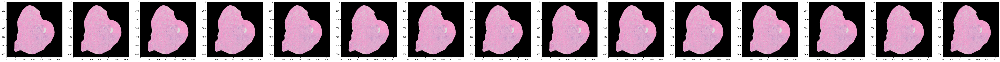

In [11]:
fig, axs = plt.subplots(1, len(reg_result), figsize=(len(reg_result)*6, 6))
for idx, reg_res in enumerate(reg_result):
    axs[idx].imshow(reg_res[1]/255.)


In [17]:
hist_resolution = hist_img.resolution[0]
hist_conversion_factor_w = reg_resolution.get_conversion_factor(hist_resolution)   
mri_conversion_factor_w = reg_resolution.get_conversion_factor(mri_resolution)  
hist_conversion_factor_w, mri_conversion_factor_w

(Decimal('0.05333333333'), Decimal('7.91666666667'))

In [14]:
hist_resolution, reg_resolution, mri_resolution

(DUnit(value=4, symbol='μm', factor=-6),
 DUnit(value=75, symbol='μm', factor=-6),
 DUnit(value=Decimal('0.59375'), symbol='mm', factor=-3))

In [22]:
a = preprocess_mri2(sitk.GetArrayFromImage(mri_cube), sitk.GetArrayFromImage(mri_masks))

133


In [17]:
sitk.GetArrayFromImage(mri_cube)[0].shape

(320, 320)

In [ ]:
mri_cube.GetSpacing()
resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')

In [8]:
hist_img.scale_to_resolution(DUnit(75, 'um'))
hist_mask.scale_to_resolution(DUnit(75, 'um'))

In [10]:
w, h = hist_img.data.shape[:2]
hist_img.flip()
hist_mask.flip()

padding = get_padding_params(hist_img.data, np.max(hist_img.data.shape[:2]))
hist_img.pad(padding)
hist_mask.pad(padding)

In [8]:
mri_cube.GetSpacing()
resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
resolution = (resolution, resolution)
mri_cube_np = sitk.GetArrayFromImage(mri_cube)
mri_masks_np = sitk.GetArrayFromImage(mri_masks)
mri_slices = []
mri_mask_slices = []
for idx in range(mri_cube_np.shape[0]):
    resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
    resolution = (resolution, resolution)

    mask = mri_masks_np[idx]
    mask[mask != 0] = 1
    if mask.sum() == 0:
        continue
    mri_cube_np_ = mri_cube_np[idx] * mask
    points = np.argwhere(mask != 0)
    points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
    y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
    mri_cube_np_ = mri_cube_np_[x:x+w, y:y+h]
    mask = mask[x:x+w, y:y+h]
    mri_slice = MImage(data=mri_cube_np_, resolution=resolution)

    mri_slice.scale_to_resolution(DUnit(75, 'um'))
    mri_slices.append(mri_slice)
    resolution = DUnit(mri_cube.GetSpacing()[0], 'mm')
    resolution = (resolution, resolution)    
    mri_mask_slice = MAnnotation(data=mask, resolution=resolution)
    mri_mask_slice.scale_to_resolution(DUnit(75, 'um'))
    mri_mask_slices.append(mri_mask_slice)



In [10]:
slice_idx = 12
neighbor_slice_idx = 13

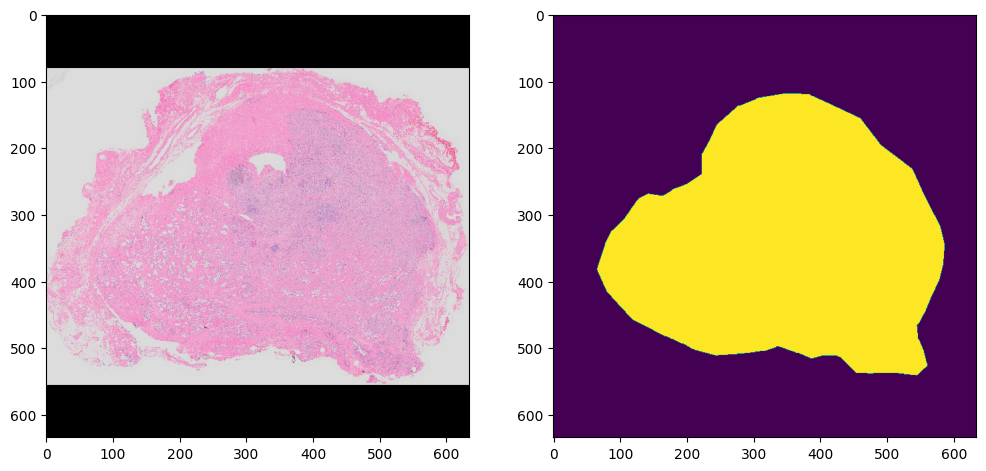

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(warped_hist_img.data)
axs[1].imshow(warped_hist_mask.data)

In [13]:
hist_img, hist_mask, hist_prepr_dict = preprocess_hist_miit(warped_hist_img.data, warped_hist_mask.data)

In [14]:
mri_slices_np = [x.data.copy() for x in mri_slices]
mri_mask_slices_np = [x.data.copy() for x in mri_mask_slices]
prepr_mri = preprocess_mri(mri_slices_np, mri_mask_slices_np)

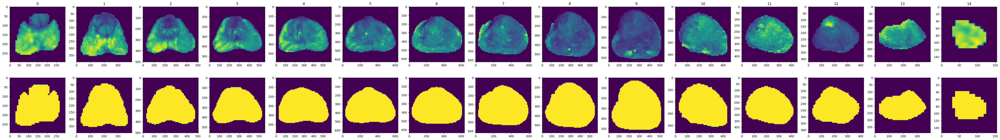

In [15]:
fig, axs = plt.subplots(2, len(prepr_mri), figsize=(4*len(prepr_mri), 4*2))
for idx, (mri, mri_mask, _, slice_idx) in enumerate(prepr_mri):
    axs[0, idx].imshow(mri)
    axs[1, idx].imshow(mri_mask)
    axs[0, idx].set_title(f'{slice_idx}')

In [26]:
a = sitk.GetArrayFromImage(mri_cube)
a.shape

(30, 320, 320)

In [32]:
sitk.GetArrayFromImage(mri_masks).shape

(30, 320, 320)

In [28]:
b = np.moveaxis(a, 0, 2)
c = scale_image(b, (2,2), interpolation=cv2.INTER_CUBIC)

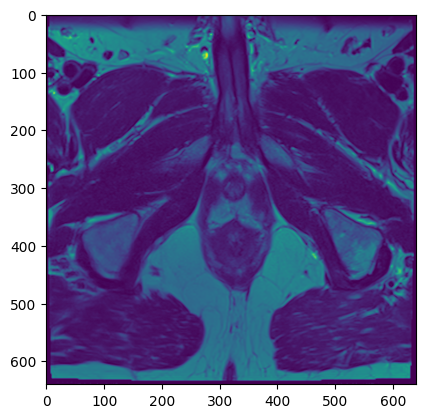

In [30]:
plt.imshow(c[:,:,5])

In [19]:
hist_resolution = DUnit('4', 'um')
mri_resolution = DUnit('0.5', 'mm')

hist_dec = hist_resolution.to_dec()
mri_dec = mri_resolution.to_dec()

In [20]:
hist_resolution.get_conversion_factor(mri_resolution)

Decimal('125.00000000000')

In [16]:
dir(hist_resolution)

['_DUnit__verify_symbol',
 '__annotations__',
 '__class__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_factor',
 '_symbol',
 'convert_to_unit',
 'default_dunit',
 'equal_instance',
 'factor',
 'from_dict',
 'get_conversion_factor',
 'scale',
 'symbol',
 'to_dec',
 'to_decimal',
 'to_float',
 'to_json',
 'value']

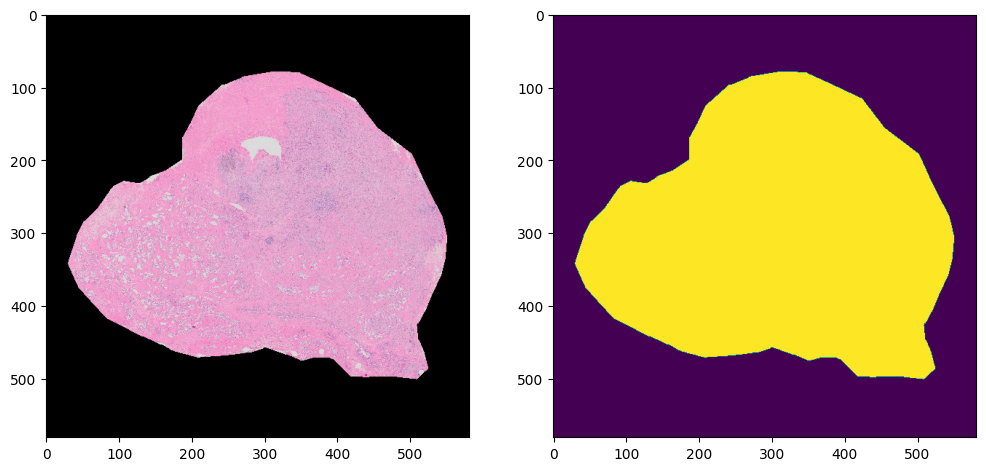

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(hist_img)
axs[1].imshow(hist_mask)

In [19]:
feature_extraction_cnn = 'resnet101'

# model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
# model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

model_aff_path = 'model_data/best_CombinedLoss_affine_resnet101.pth.tar'
model_tps_path = 'model_data/best_CombinedLoss_tps_resnet101.pth.tar'

model_cache = load_models(feature_extraction_cnn, model_aff_path, model_tps_path, do_deformable=True)

tr = [1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0]

half_out_size = 500

Creating CNN model...
Loading trained model weights...


In [32]:
feature_extraction_cnn = 'resnet101'

# model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
# model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

model_aff_path = 'model_data/best_CombinedLoss_affine_resnet101.pth.tar'
model_tps_path = 'model_data/best_CombinedLoss_tps_resnet101.pth.tar'

registerer = ProsRegNet.init_registerer(model_aff_path, model_tps_path, False, feature_extraction_cnn)

TypeError: ProsRegNet.__init__() got an unexpected keyword argument 'use_cuda'

In [20]:
def register(mri_slices: list[np.ndarray], 
             hist_image: np.ndarray, 
             model_cache,
             use_masks_as_affine: bool = True): 
    ####### grab files that were preprocessed 

    max_size = 0
    for mri_slice in mri_slices:
        temp_size = mri_slice.shape[0]
        if temp_size > max_size:
            max_size = temp_size
    
    reg_data = []
    count = len(mri_slices)
    for idx in range(count): 
        print(idx)
        imMri_highRes = mri_slices[idx]
        pad_len = int((max_size - imMri_highRes.shape[0]) // 2)
        if pad_len > 0:
            imMri_highRes = np.pad(imMri_highRes, ((pad_len, pad_len), (pad_len, pad_len)), constant_values=0)
        w_new, h_new = imMri_highRes.shape[:2]
        affTps, theta = runCnn2(model_cache, hist_image, imMri_highRes, use_masks_as_affine)         
        affTps = cv2.resize(affTps*255, (int(h_new),  int(w_new)), interpolation=cv2.INTER_CUBIC)   
        
        reg_data.append((idx, hist_image, imMri_highRes, affTps, theta))
    
    return reg_data



In [21]:
p_mri_slices = []
p_mri_mask_slices = []
coords = []


for prepr_mri_ in prepr_mri:
    mri_slice, mri_mask, coord, slice = prepr_mri_
    p_mri_slices.append(mri_slice)
    p_mri_mask_slices.append(mri_mask)
    coords.append(coord)

In [24]:
reg_data = register(p_mri_slices, hist_img, model_cache, use_masks_as_affine = False)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09317545..1.0265453].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10638676..1.0562398].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1049996..1.0169607].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08107105..1.0045137].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.095252596..1.0272764].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.097131744..1.0523403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.104485914..1.0259081].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-

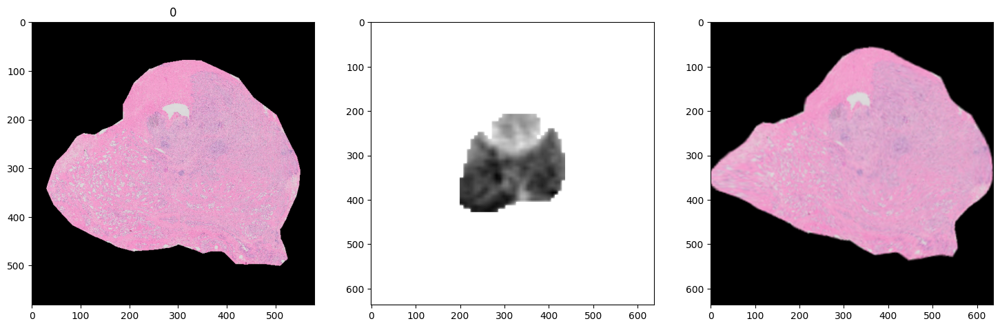

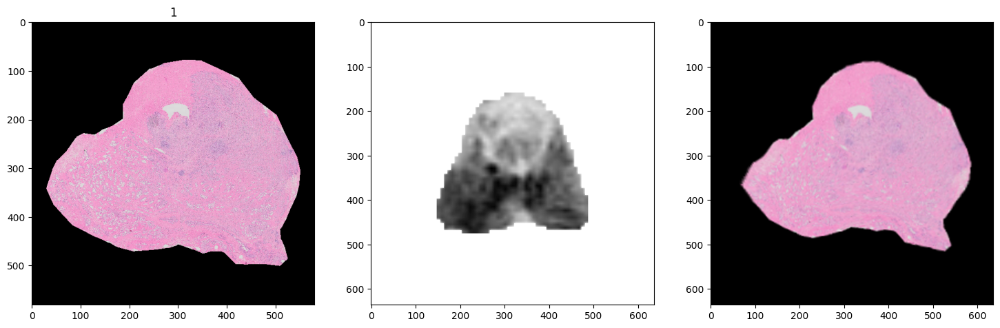

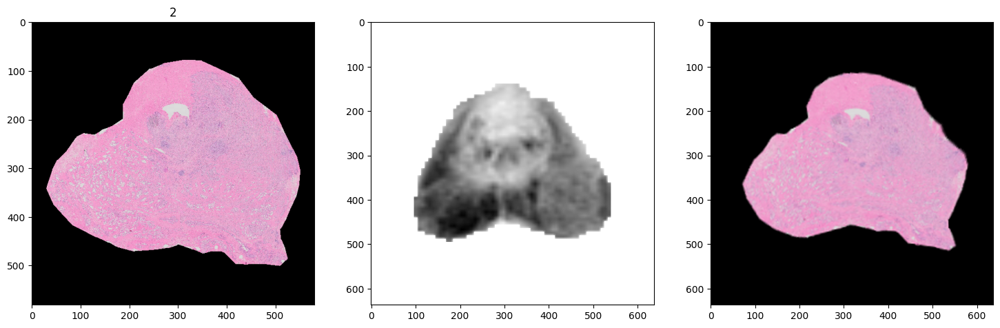

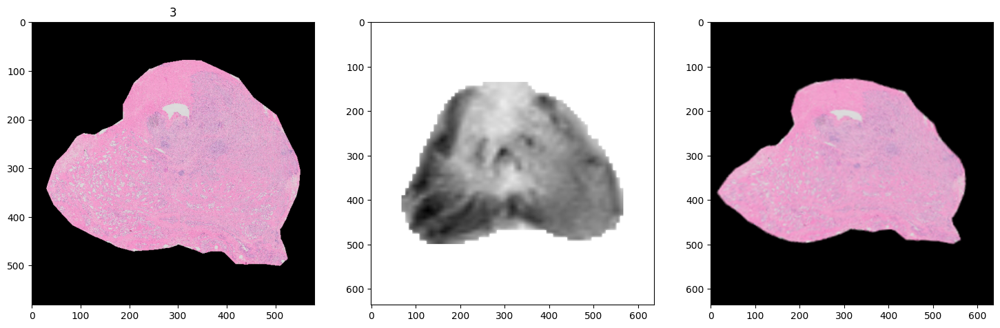

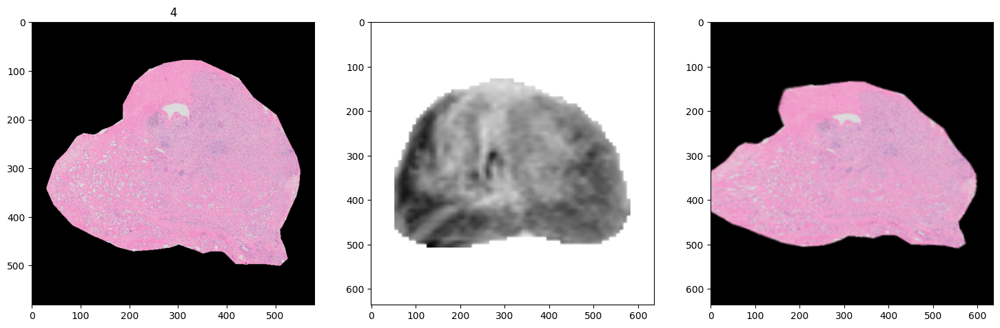

...

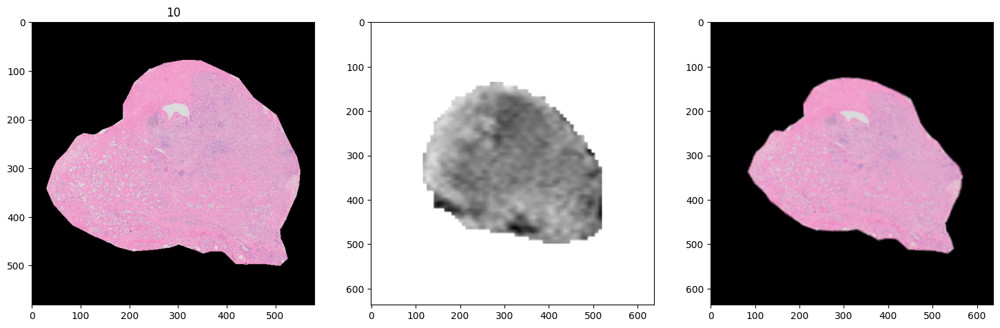

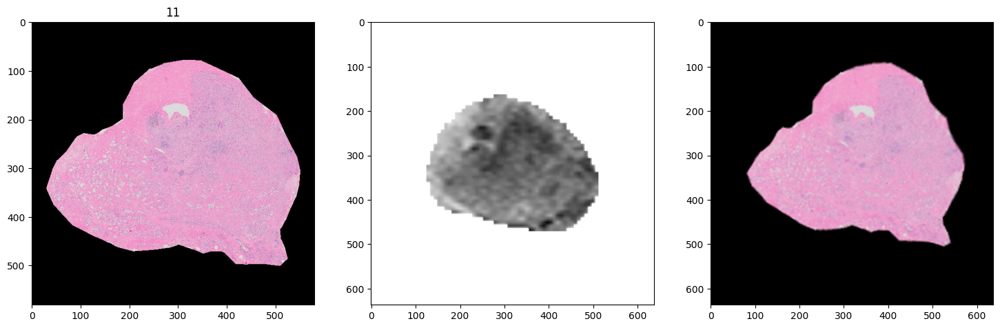

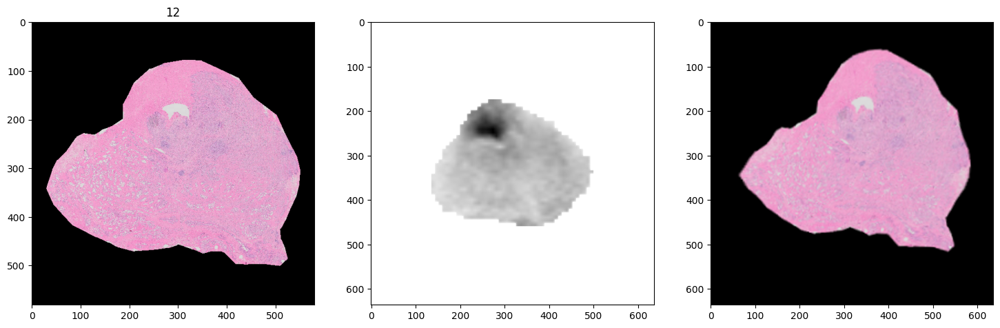

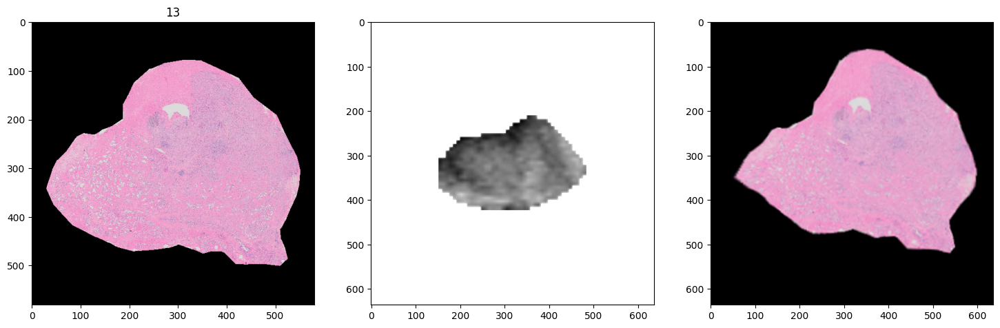

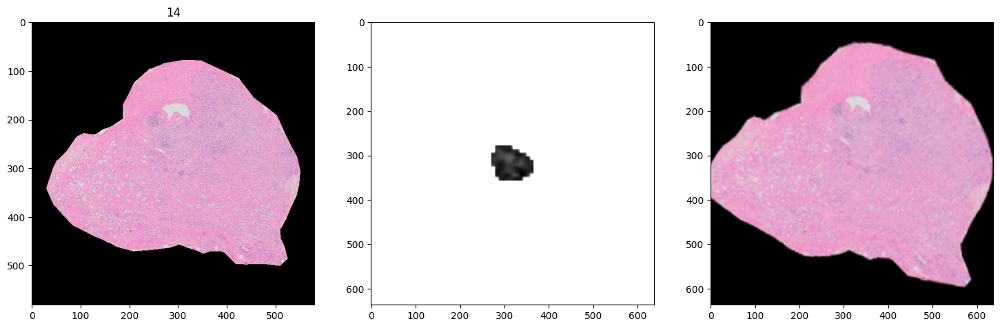

In [26]:
# fig, axs = plt.subplots(len(reg_data), 3, figsize=(18, len(reg_data)*6))
for idx, reg_ret in enumerate(reg_data):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    (_, hist_image, imMri_highRes, affTps, theta) = reg_ret
    axs[0].imshow(hist_image)
    axs[0].set_title(f'{idx}')
    axs[1].imshow(imMri_highRes, cmap=plt.cm.binary)
    axs[2].imshow(affTps/255)
    # axs[idx, 0].imshow(hist_image)
    # axs[idx, 0].set_title(f'{idx}')
    # axs[idx, 1].imshow(imMri_highRes, cmap=plt.cm.binary)
    # axs[idx, 2].imshow(affTps/255)

In [25]:
import torch
x = torch.zeros((1, 64, 5, 5))
x.view(x.size(0), -1)

tensor([[0., 0., 0.,  ..., 0., 0., 0.]])

In [5]:
####### INPUTS
# json_path = "jsonData/TCIA_FUSION.json"
# preprocess_moving = True
# preprocess_fixed = True
# run_registration = True
# extension = 'nii.gz'
# timings = {}

# try:
#     with open('coord.txt') as f:
#         coord = json.load(f)   
        
# except:
#     coord = {}

# ############### START REGISTRATION HERE

# json_obj = ParserRegistrationJson(json_path)

# studies = json_obj.studies
# toProcess = json_obj.ToProcess}
# outputPath = json_obj.output_path
outputPath = 'temp/out'
#cases = toProcess.keys()

if not os.path.isdir(outputPath):
    os.mkdir(outputPath) 

###### PREPROCESSING DESTINATIONS ######################################
preprocess_moving_dest = outputPath + 'preprocess/hist/'
preprocess_fixed_dest = outputPath + 'preprocess/mri/'
Path(preprocess_fixed_dest).mkdir(exist_ok=True, parents=True)
Path(preprocess_moving_dest).mkdir(exist_ok=True, parents=True)

# if not os.path.isdir(outputPath + 'preprocess\\'):
#     os.mkdir(outputPath + 'preprocess\\')

# if not os.path.isdir(preprocess_moving_dest):
#     os.mkdir(preprocess_moving_dest)
    
# if not os.path.isdir(preprocess_fixed_dest):
#     os.mkdir(preprocess_fixed_dest)

In [26]:
import numpy

def get_padding_params(img: numpy.array, shape: int) -> tuple[int, int, int, int]:
    pad_x = shape - img.shape[0]
    pad_x_l = pad_x // 2
    pad_x_u = pad_x // 2
    if pad_x % 2 != 0:
        pad_x_u += 1
    pad_y = shape - img.shape[1]
    pad_y_l = pad_y // 2
    pad_y_u = pad_y // 2
    if pad_y % 2 != 0:
        pad_y_u += 1
    return pad_y_l, pad_y_u, pad_x_l, pad_x_u

def preprocess_hist_miit(img, mask):
    """Does the following preprocessing steps:
        1. Applies mask.
        2. Crops around the masked area.
        3. Adds padding.
    """

    # Downsize by 4. Or resize to 500px
    img = img * mask
    # This doesnt make sense, since the cropping happens immediately afterwards.
    # Maybe a refactoring mistake?
    # img = np.pad(img,((img.shape[0],img.shape[0]),(img.shape[1],img.shape[1]),(0,0)),'constant', constant_values=0)
    # mask = np.pad(mask,((mask.shape[0], mask.shape[0]), (mask.shape[1], mask.shape[1]),(0,0)),'constant', constant_values=0)

    # create a bounding box around slice
    preprocessing_steps = {}
    points = np.argwhere(mask != 0)
    points = np.fliplr(points) # store them in x,y coordinates instead of row,col indices
    y, x, h, w = cv2.boundingRect(points) # create a rectangle around those points
    preprocessing_steps['y'] = y
    preprocessing_steps['x'] = x
    preprocessing_steps['h'] = h
    preprocessing_steps['w'] = w
    # Pad to a square shape now.
    max_size = max(img.shape[0], img.shape[1])
    xlo, xhi, ylo, yhi = get_padding_params(img, max_size)
    img = np.pad(img,((xlo, xhi),(ylo, yhi),(0,0)),'constant', constant_values=0)
    mask = np.pad(mask,((xlo, xhi), (ylo, yhi)),'constant', constant_values=0)
    preprocessing_steps['padding'] = (xlo, xhi, ylo, yhi)
    return img, mask, preprocessing_steps

# def preprocess_mri_miit()


In [6]:
preprocessed_hist = preprocess_hist2(hist_img, hist_mask)
coord, preprocessed_mri, preprocessed_mri_masks = preprocess_mri2(mri_cube, mri_masks)

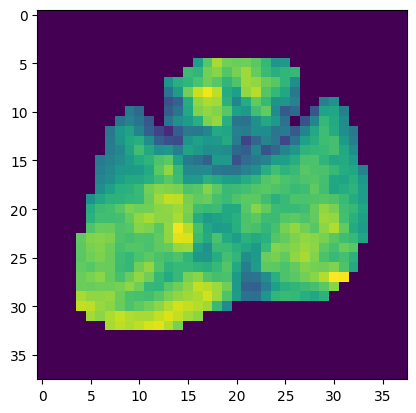

In [17]:
plt.imshow(preprocessed_mri[0])

Creating CNN model...
Loading trained model weights...


ValueError: could not broadcast input array from shape (38,38) into shape (1387,1388,3)

In [3]:
# start doing preprocessing on each case and register
for s in json_obj.studies:
    if json_obj.ToProcess:
        if not (s in json_obj.ToProcess):
            print("Skipping", s)
            continue

    print("x"*30, "Processing", s,"x"*30)
    studyDict = json_obj.studies[s] 


    studyParser = ParserStudyDict(studyDict)
    
    sid = studyParser.id
    fixed_img_mha = studyParser.fixed_filename
    fixed_seg = studyParser.fixed_segmentation_filename
    moving_dict = studyParser.ReadMovingImage()

    ###### PREPROCESSING HISTOLOGY HERE #############################################################
    if preprocess_moving == True: 
        print('Preprocessing moving sid:', sid, '...')
        preprocess_hist(moving_dict, preprocess_moving_dest, sid)
        print('Finished preprocessing', sid)

    ###### PREPROCESSING MRI HERE #############################################################
    if preprocess_fixed == True:
        print ("Preprocessing fixed case:", sid, '...')

        coord = preprocess_mri(fixed_img_mha, fixed_seg, preprocess_fixed_dest, coord, sid)

        print("Finished processing fixed mha", sid)

        with open('coord.txt', 'w') as json_file: 
            json.dump(coord, json_file)
    ##### ALIGNMENT HERE ########################################################################
    if run_registration == True: 
        
        ######## LOAD MODELS
        print('.'*30, 'Begin deep learning registration for ' + sid + '.'*30)

        try:
            model_cache
        except NameError:
            feature_extraction_cnn = 'resnet101'

            model_aff_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_affine_resnet101.pth.tar'
            model_tps_path = 'C:/Users/weishao/Desktop/Code_ProsRegNet/trained_models/best_CombinedLoss_tps_resnet101.pth.tar'

            model_cache = load_models(feature_extraction_cnn, model_aff_path, model_tps_path, do_deformable=True)
        
        start = time.time()
        output3D_cache = register(preprocess_moving_dest + sid + '\\', preprocess_fixed_dest + sid + '\\', coord, model_cache, sid)
        out3Dhist_highRes, out3Dmri_highRes, out3Dcancer_highRes, out3D_region00, out3D_region10, out3D_region09, out3Dmri_mask = output3D_cache
        end = time.time()
        print("Registration done in {:6.3f}(min)".format((end-start)/60.0))
        imMri = sitk.ReadImage(fixed_img_mha)
        mriOrigin = imMri[:,:,coord[sid]['slice'][0]:coord[sid]['slice'][-1]].GetOrigin()
        mriSpace  = imMri.GetSpacing()
        mriDirection = imMri.GetDirection()

        imSpatialInfo = (mriOrigin, mriSpace, mriDirection)

        # write output hist 3D volume to .nii.gz format
        fn_moving_highRes = '_moved_highres_rgb.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3Dhist_highRes, sid, fn_moving_highRes, imSpatialInfo, coord, imMri, extension = "nii.gz")

        #write output mri 3D volume to .nii.gz format
        fn_fixed_highRes = '_fixed_image.'
        output_results(outputPath, out3Dmri_highRes, sid, fn_fixed_highRes, imSpatialInfo, extension = "nii.gz")

        #write output cancer outline 3D volume to .nii.gz format
        fn_cancer_highRes = '_moved_highres_region01_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3Dcancer_highRes, sid, fn_cancer_highRes, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write region00
        fn_region00 = '_moved_highres_region00_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3D_region00, sid, fn_region00, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write region10
        fn_region00 = '_moved_highres_region10_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3D_region10, sid, fn_region00, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write region09
        fn_region00 = '_moved_highres_region09_label.'
        output_results_high_res(preprocess_moving_dest + sid + '\\',preprocess_fixed_dest,outputPath, out3D_region09, sid, fn_region00, imSpatialInfo, coord, imMri, extension = "nii.gz")
        
        #write mriMask
        fn_mriMask = '_fixed_mask_label.'
        output_results(outputPath, out3Dmri_mask, sid, fn_mriMask, imSpatialInfo, extension = "nii.gz")

        timings[s] = (end-start)/60.0
        print('Done!')

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx Processing aaa0069 xxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
Preprocessing moving sid: aaa0069 ...
Finished preprocessing aaa0069
Preprocessing fixed case: aaa0069 ...
Finished processing fixed mha aaa0069
.............................. Begin deep learning registration for aaa0069..............................
Creating CNN model...
Loading trained model weights...
Registration done in  0.156(min)
Done!


In [ ]:
json.dump(timings, open("timings.txt",'w'))